# Capstone Project:
# Using machine learning and technical analysis on stock prices predictions

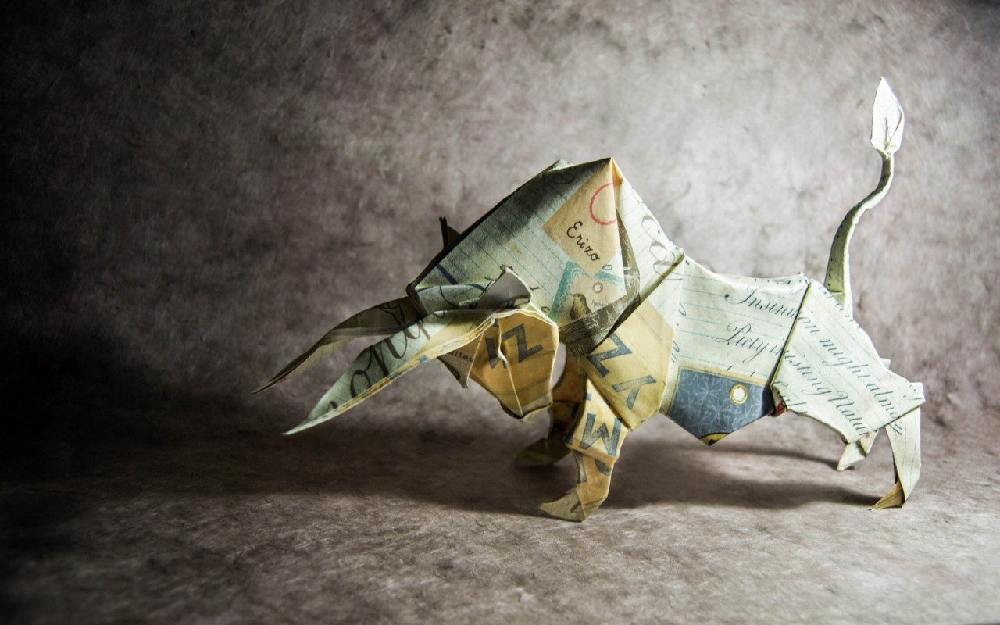

In [1]:
from IPython.display import Image
Image("Images/bull.jpg", width = 950) 
# image from https://wallpaperstock.net/origami-bull-wallpapers_w53502.html

Most traders use technical analysis to create their prediction strategy, and most machine learning engineer use some kind algorithm to predict the data

The main question for this project is: Can we combine these two tools in order to accurately predict the stock prices?

In this notebook, we are going to create a support vector machine as a brenchmark model and a recurrent neural network as our final model. They will use stock quotes and technical analysis indicators to predict the closing price of a stock for a given day

A better description of the outline of the project can be found in the proposal.pdf file. You can also check the project report through report.pdf file

## 1. Preparation of dataset 

The purpose of this section is to get the stock data of a given company, preprocess them adding and removing information, normalizing and defining the inputs and outputs to feed our models, visualizing the results in the end.

### 1.1 Getting the data

The data set will be obtained from Yahoo Finance by running the two code cells below

In [2]:
import os.path
import datetime
import pandas as pd

import pandas_datareader.data 
import fix_yahoo_finance as yf 
import pandas_datareader.wb as wb

yf.pdr_override()
pd.core.common.is_list_like = pd.api.types.is_list_like


def getFinantialData(ticker, start, end, overwrite = False): 
    '''
    Helper function to obtain the data.
    
    Parameters:
    - ticker: The ticker of the company on the S&P500.
    - start: the sart data
    - end: the end data
    - overwrite:
        If there is no data or overwrite equals True:
            Retrieve stock data from Yahoo Finance
        Else read the dataset from a csv file
    '''
    
    if os.path.exists('Data/'+ticker+'.csv') and overwrite == False:
        print('Dataset read from Data/'+ticker+'.csv')
        return pd.read_csv('Data/'+ticker+'.csv')
    
    else:
        print('Dataset retrived from Yahoo Finance')
        
    data = pandas_datareader.data.get_data_yahoo(ticker, start, end)
    data = pd.DataFrame(data)
   
    data.to_csv('Data/'+ticker+'.csv')

    return data

I am going to utilize the Amazon stocks dataset from 01/03/2007 to 12/30/2017 (mm/dd/yyyy), however you can use another one of your preference

Note: Be careful changing the dataset, you might have got to reconfigure the models

In [3]:
ticker = 'AMZN'
start  = datetime.date(2007,1,3)
end    = datetime.date(2017,12,30)

data = getFinantialData(ticker, start, end)

data.head()

Dataset read from Data/AMZN.csv


,Date,Open,High,Low,Close,Adj Close,Volume
0,2007-01-03,38.680000,39.060001,38.049999,38.700001,38.700001,12405100
1,2007-01-04,38.590000,39.139999,38.259998,38.900002,38.900002,6318400
2,2007-01-05,38.720001,38.790001,37.599998,38.369999,38.369999,6619700
3,2007-01-08,38.220001,38.310001,37.169998,37.500000,37.500000,6783000
4,2007-01-09,37.599998,38.060001,37.340000,37.779999,37.779999,5703000


As we can see above, the dataset was successfully loaded.

### 1.2  Adding new information to the dataset

Here we are going to add the technical analysis indicators as proposed for this project

In [4]:
# Trend Indicators:
from Helpers.technical_analysis import get_MACD
from Helpers.technical_analysis import get_moving_average
from Helpers.technical_analysis import get_exponential_moving_average

# Moment Indicators:
from Helpers.technical_analysis import get_ROC
from Helpers.technical_analysis import get_RSI
from Helpers.technical_analysis import get_stochastic_oscillatorK
from Helpers.technical_analysis import get_stochastic_oscillatorD

# Volume Indicators:
from Helpers.technical_analysis import get_OBV

# Volatility Indicators:
from Helpers.technical_analysis import get_bollinger_band

In [5]:
def add_technical_analysis(data, technical_analysis): 
    '''
    Adds the technical analysis indicators in our dataset.
    
    Parameters:
    - data: pandas DataFrame containg the stocks information
    - technical_analysis: List of technical indicators
    '''
    for key in technical_analysis.keys():   
         
        data[key] = None
        slash = len(technical_analysis[key]) 
        
        if data.shape[0] > slash:
            data = data[data.shape[0] - slash : ]  
        
        else: 
            for k in technical_analysis.keys():
                technical_analysis[k] = technical_analysis[k][slash - data.shape[0]:]
        
        data[key] = technical_analysis[key]
         
    return data

In [6]:
bollinger = get_bollinger_band(data)
tech_analysis = {'RSI': get_RSI(data, 14), 'MA10':get_moving_average(data,10), 'Roc': get_ROC(data,14),
                'Obv': get_OBV(data), 'K': get_stochastic_oscillatorK(data, 14),
                'D':get_stochastic_oscillatorD(get_stochastic_oscillatorK(data, 14)),
                'EMA': get_exponential_moving_average(data,10), 'MACD': get_MACD(data),
                'UpBand': bollinger[0], 'LowBand':bollinger[1]}

data = add_technical_analysis(data, tech_analysis)

c:\users\schneider\miniconda2\envs\tensorflow_gpu\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
c:\users\schneider\miniconda2\envs\tensorflow_gpu\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # This is added back by InteractiveShellApp.init_path()


In [7]:
data[['Date','Open','High','Low','Close','Adj Close','Volume']].head()

,Date,Open,High,Low,Close,Adj Close,Volume
72,2007-04-18,44.799999,45.150002,44.630001,44.990002,44.990002,4996400
73,2007-04-19,44.610001,45.150002,44.410000,44.639999,44.639999,4809700
74,2007-04-20,45.090000,45.169998,44.520000,44.950001,44.950001,5980500
75,2007-04-23,44.270000,44.810001,44.160000,44.770000,44.770000,7088600
76,2007-04-24,44.750000,45.000000,44.430000,44.750000,44.750000,19887600


In [8]:
data[['RSI', 'MA10','Roc', 'Obv', 'K', 'D', 'EMA', 'MACD', 'UpBand', 'LowBand']].head()

,RSI,MA10,Roc,Obv,K,D,EMA,MACD,UpBand,LowBand
72,50.450039,42.455,0.143620,20366200,-0.001453,-0.001322,43.085846,-1.565151,44.602052,37.311948
73,50.434968,42.835,0.121326,15556500,-0.001233,-0.001510,43.368419,-1.599340,45.150292,37.404708
74,50.436237,43.146,0.129681,21537000,-0.001312,-0.001386,43.655979,-1.632629,45.592453,37.446547
75,50.425453,43.473,0.107620,14448400,-0.001088,-0.001333,43.858529,-1.625746,46.013960,37.571040
76,50.411066,43.784,0.086429,-5439200,-0.000874,-0.001211,44.020614,-1.600231,46.286349,37.877651


As we noted above, the technical analysis indicators were added, however we lost a small part of our data due to the fact that to calculate the technical indicator is necessary to use information from previous days

### 1.3 Removing unnecessary  information from our data

The High, Low and Adj Close columns represent the highest, the lowest, and the closing value of the stock on a given day, respectively. We will not use these columns as input to our models because we will predict the closing of the stock day, not having access to this information in a real situation. This information could be used as input if we used the previous day information, however they will be used in the indicators of technical analysis, which made me choose to discard them

In [9]:
# excluiremos a data cronologica e representaremos por time_steps ou indices 
data['Step'] = range(len(data))
data = data[['Step','Open', 'Close', 'Volume', 'RSI', 'MA10', 
             'EMA', 'MACD', 'Roc', 'K', 'D', 'Obv', 'UpBand', 'LowBand' ]] 

In [10]:
data.head() 

,Step,Open,Close,Volume,RSI,MA10,EMA,MACD,Roc,K,D,Obv,UpBand,LowBand
72,0,44.799999,44.990002,4996400,50.450039,42.455,43.085846,-1.565151,0.143620,-0.001453,-0.001322,20366200,44.602052,37.311948
73,1,44.610001,44.639999,4809700,50.434968,42.835,43.368419,-1.599340,0.121326,-0.001233,-0.001510,15556500,45.150292,37.404708
74,2,45.090000,44.950001,5980500,50.436237,43.146,43.655979,-1.632629,0.129681,-0.001312,-0.001386,21537000,45.592453,37.446547
75,3,44.270000,44.770000,7088600,50.425453,43.473,43.858529,-1.625746,0.107620,-0.001088,-0.001333,14448400,46.013960,37.571040
76,4,44.750000,44.750000,19887600,50.411066,43.784,44.020614,-1.600231,0.086429,-0.000874,-0.001211,-5439200,46.286349,37.877651


### 1.4 Analyzing  our variables

In this section, we are going to explore the data through views and codes to understand how our dataset are relevant and how each feature is related to others and what can be done with that

In [11]:
# Numerical features to analyse
numerical = ['Open', 'Close', 'Volume', 'RSI', 'MA10', 'EMA', 'MACD', 'Roc', 'K', 'D', 'Obv', 'UpBand', 'LowBand']

data[['Open', 'Close', 'Volume', 'RSI', 'MA10', 'EMA', 'MACD']].describe()

,Open,Close,Volume,RSI,MA10,EMA,MACD
count,2697.000000,2697.000000,2.697000e+03,2697.000000,2697.000000,2697.000000,2697.000000
mean,330.745814,330.782447,5.791825e+06,50.692084,328.468250,328.891562,-2.886193
std,280.335706,280.181034,5.016062e+06,0.359470,277.700908,278.067662,7.770532
min,35.290001,35.029999,9.844000e+05,50.171309,39.869000,40.829737,-39.603311
25%,118.709999,118.870003,2.999400e+06,50.484783,118.962000,118.969191,-5.400720
50%,235.410004,234.779999,4.507300e+06,50.606913,232.952000,233.554650,-2.059759
75%,422.959991,421.779999,7.068200e+06,50.822792,401.850000,412.484975,1.001646
max,1204.880005,1195.829956,1.043292e+08,53.274836,1179.721997,1177.369563,35.165931


In [12]:
data[[ 'Roc', 'K', 'D', 'Obv', 'UpBand', 'LowBand']].describe()

,Roc,K,D,Obv,UpBand,LowBand
count,2697.000000,2697.000000,2697.000000,2.697000e+03,2697.000000,2697.000000
mean,0.021303,-0.000646,-0.000647,4.533747e+08,345.379995,307.365068
std,0.088971,0.000704,0.000671,1.617220e+08,286.980792,264.488093
min,-0.388015,-0.005140,-0.005010,-5.439200e+06,44.602052,31.482519
25%,-0.029405,-0.000921,-0.000907,3.075317e+08,128.994719,109.674316
50%,0.017691,-0.000491,-0.000483,4.698280e+08,248.115870,216.116316
75%,0.064854,-0.000188,-0.000190,5.704414e+08,432.160426,385.059614
max,0.506238,0.001295,0.000488,7.732871e+08,1210.983895,1140.552939


Through the statistical description above, we can easily notice through the mean the scale order of each feature, it is notable that some variables are in a very large scale order such as OBV (1x10 ^ 8) and Volume (5x10 ^ 6) while other variables are in an extremely low scale order such as the case of stochastic oscillators (1x10 ^ (- 4)) and Roc (1 * 10 ^ (- 2)), this behavior of the data can also be noticed by the values ​​of minimum and maximum, which are completely different from each other

Another way to visualize this dissipation of scale is graphically, as shown below

In [13]:
from Helpers.data_vizualization import plot_timeserie 

title =  ticker + ' Features'
xaxis  = 'Time Steps'
yaxis  = 'True value of the variables'
plot_timeserie(data[numerical], title, xaxis, yaxis)

We can see through the graph that our data are highly denormalized, the OBV and Volume are on a much larger scale than the other variables, so graphically it is not possible to visualize the variations of the other variables

Letting the data in this way can harm our models, since only a few variables will be 'focused' while the others will be reduced. That said, we have got to normalize our dataset

### 1.5 Normalizing data

In [14]:
from sklearn.preprocessing import MinMaxScaler

def get_normalised_data(data, numerical):
    '''
    Normalises the numerical data from our dataframe using MinMaxScaler from sklearn.
    
    Parameters:
    - data: a Pandas DataFrame 
    - numerical: a list of stings containing the name of the numerical colluns of the dataset.
    '''
     
    scaler = MinMaxScaler()
    data[numerical] = scaler.fit_transform(data[numerical])
    
    return data


In [15]:
data = get_normalised_data(data, numerical)
data[['Open', 'Close', 'Volume', 'RSI', 'MA10', 'EMA', 'MACD']].describe()

,Open,Close,Volume,RSI,MA10,EMA,MACD
count,2697.000000,2697.000000,2697.000000,2697.000000,2697.000000,2697.000000,2697.000000
mean,0.252615,0.254783,0.046518,0.167801,0.253190,0.253455,0.491072
std,0.239687,0.241369,0.048537,0.115826,0.243629,0.244662,0.103927
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.071324,0.072226,0.019498,0.101006,0.069389,0.068752,0.457442
50%,0.171103,0.172080,0.034089,0.140358,0.169393,0.169572,0.502126
75%,0.331458,0.333175,0.058869,0.209917,0.317568,0.327006,0.543070
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
data[[ 'Roc', 'K', 'D', 'Obv', 'UpBand', 'LowBand']].describe()

,Roc,K,D,Obv,UpBand,LowBand
count,2697.000000,2697.000000,2697.000000,2697.000000,2697.000000,2697.000000
mean,0.457721,0.698383,0.793665,0.589185,0.257873,0.248751
std,0.099492,0.109443,0.122079,0.207675,0.246044,0.238477
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.401017,0.655616,0.746316,0.401901,0.072354,0.070502
50%,0.453681,0.722379,0.823353,0.610314,0.174483,0.166476
75%,0.506422,0.769523,0.876811,0.739516,0.332274,0.318805
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [17]:
title = 'Normalized Stock data of ' + ticker
xaxis  = 'Time Steps'
yaxis  = 'Normalized Features'
plot_timeserie(data[numerical], title, xaxis, yaxis)

We can verify above by the statistical description that all features have a minimum value of zero and a maximum value of one. We can also verify that the mean of all the characteristics are on the same scale. Now we are able to graphically view the changes through time of all features

With that we can conclude that the data were successfully normalized, now we just have got to split our dataset

### 1.6 Splitting the dataset

In this session we will divide from our dataset into inputs (X) and outputs (y). In order to avoid overfitting, we will also split our data between training set and test set, so that way we can test our model on previously unseen data

In [18]:
import math 
import numpy as np
from sklearn.model_selection import TimeSeriesSplit

X = np.array(data[['Open', 'Close', 'Volume', 'RSI', 'MA10', 
                   'EMA', 'MACD', 'Roc', 'K', 'D', 'Obv', 'UpBand', 'LowBand']])
y = np.array(data[['Close']]).ravel()

tscv = TimeSeriesSplit(n_splits=3)
 
for train_index, test_index in tscv.split(X): 
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]  

# Show the results of the split 
print('%.1f%% of the data is for training. Total of %.0f samples' 
      % (100 * X_train.shape[0] / X.shape[0], X_train.shape[0]))
print('%.1f%% of the data is for testing. Total of %.0f samples' 
      % (100 * X_test.shape[0] / X.shape[0], X_test.shape[0]))

75.0% of the data is for training. Total of 2023 samples
25.0% of the data is for testing. Total of 674 samples


### 1.7 Visualizing  the final form of the dataset

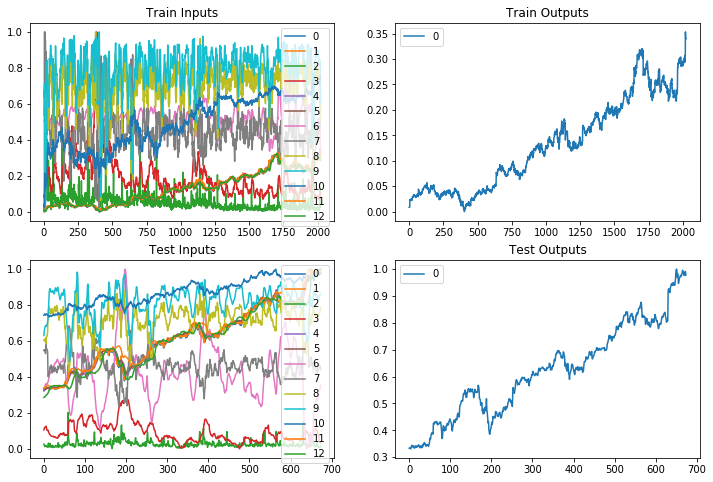

In [20]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

pd.DataFrame(X_train).plot(ax=axes[0,0], title="Train Inputs")
pd.DataFrame(y_train).plot(ax=axes[0,1], title="Train Outputs")

pd.DataFrame(X_test).plot(ax=axes[1,0], title="Test Inputs")
pd.DataFrame(y_test).plot(ax=axes[1,1], title="Test Outputs")

By visualizing the final form of our dataset, we can see that the outputs of the test data have higher values ​​than those of training, however we assume that the models must be able to detect this increase due to the variations of the input characteristics

## 2. Bench Mark Model

As proposed for this project, in this session we will create a regression support vector machine as benchmark model, this model will be initially created with the defout parameters, we will measure its efficiency and try to improve it tunning their parameters. Finally, we are going to evaluate the model and visualize the results of their predictions graphically

### 2.1 Untuned Bench Mark Model

#### 2.1.1 Creating 

In [21]:
from sklearn.svm import SVR

predictor = SVR() 

#### 2.1.2 Training

In [22]:
predictor.fit(X_train, y_train) 

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='auto',
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

#### 2.1.3 Evaluating

For both models we will use the Mean Squared Error (MSE) as a measure of performance. For a model to achieve a good score, the MSE should be as close to zero as possible (approximately four decimal places)

In [23]:
from IPython.display import display
from sklearn import linear_model 
from sklearn.metrics import mean_squared_error

In [24]:
test_predictions_SVR  = predictor.predict(X_test)
train_predictions_SVR = predictor.predict(X_train) 

trainScore = mean_squared_error(y_train, train_predictions_SVR)
print('Train Score: %.8f MSE' % (trainScore))

testScore = mean_squared_error(y_test, test_predictions_SVR)
print('Test Score:  %.8f MSE' % (testScore))

Train Score: 0.00400146 MSE
Test Score:  0.11320664 MSE


We can note from MSE that the model did not have an expected performance for both sets

We can also infer that the support vector failed to generalize its predictions to the test data, but we will try to adjust its parameters to make better predictions

### 2.3 Tuned model 

#### 2.3.1 Tuning the model

In [25]:
from sklearn.grid_search import GridSearchCV 

def mse_scorer(reg, x, y):
    y_pred = reg.predict(x)
    return mean_squared_error(y, y_pred)

predictor = SVR() 

parameters =  [{'C':[1.0, 1.2, 0.8],
                'epsilon':[0.1, 0.01, 0.001], 
                'coef0':[0.0, 1e-3, 1e-4, 1e-5],
                'kernel': ['rbf', 'linear', 'sigmoid'], 
                'tol': [1e-3, 1e-4, 1e-5]
                 }] 
 
grid_obj = GridSearchCV(predictor, parameters, scoring=mse_scorer) 

grid_obj.fit(X_train, y_train)

predictor = grid_obj.best_estimator_

print("Best Parameters")
print(grid_obj.best_params_) 

c:\users\schneider\miniconda2\envs\tensorflow_gpu\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.

c:\users\schneider\miniconda2\envs\tensorflow_gpu\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.



Best Parameters
{'coef0': 0.0, 'kernel': 'rbf', 'tol': 1e-05, 'C': 0.8, 'epsilon': 0.1}


#### 2.3.2 Evaluating the Tuned model

In [26]:
test_predictions_tunedSVR  = predictor.predict(X_test)
train_predictions_tunedSVR = predictor.predict(X_train) 

trainScore = mean_squared_error(y_train, train_predictions_tunedSVR)
print('Train Score: %.8f MSE' % (trainScore))

testScore = mean_squared_error(y_test, test_predictions_tunedSVR)
print('Test Score:  %.8f MSE' % (testScore))

Train Score: 0.00398093 MSE
Test Score:  0.11338206 MSE


By visualizing the scores of the model, we can see that while trying to adjust its parameters in several ways, the model had only a small improvement in the training set, while it worsened in the test data. However, the changes were so small that the model continues making bad predictions

### 2.4 Visualizing  the Bench Mark Model's predictions

Here we can view graphically the predictions of the tuned model, for both test data as for the training data

In [42]:
title = 'Real Closed X Predictions with Tuned SVR'
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

y_yHat = {'Training set': y_train, 'Predictions': train_predictions_tunedSVR}
time_serie = pd.DataFrame(data = y_yHat)  
plot_timeserie(time_serie, title, xaxis, yaxis)

In [43]:
title = 'Real Closed X Predictions with Tuned SVR'
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

y_yHat = {'Test set': y_test, 'Predictions': test_predictions_tunedSVR}
time_serie = pd.DataFrame(data = y_yHat)  
plot_timeserie(time_serie, title, xaxis, yaxis)

We can verify both graphically and through the Mean Squared Error that the model based on support vectors failed to achieve good performances for this task

## 3. LSTM MODEL

In this session we will create a model based on artificial neural networks, more specifically, using recurrent neural networks, which have the ability to relate temporal patterns

###  3.1 Reshaping the inputs

For our neural network model we will have got to reshape our inputs due to the Keras library requirement we will be using

In [29]:
# reshaping the inpust to feed our neural networks
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))

In [30]:
print(X_train.shape)

(2023, 1, 13)


### 3.2 Untuned Model

#### 3.2.1 Creating the model

Here we are going to create a simple model of recurrent neural network and measure its accuracy, then we will try to improve the model as we have done with the support vector machine

In [31]:
import math
import pandas as pd
import numpy as np
from IPython.display import display

from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.layers import Flatten
from keras.models import Sequential
from keras.callbacks import TensorBoard
from keras.metrics import mean_squared_error

from sklearn.model_selection import StratifiedKFold

Using TensorFlow backend.


In [32]:
# Creating our model

model = Sequential()

model.add(LSTM(
            input_shape=(None, X_train.shape[-1]),
            units = 30,
            return_sequences=False
          ))

model.add(Dropout(0.2))

model.add(Dense(units=1))

model.add(Activation('linear'))

model.compile(loss='mean_squared_error', optimizer='adam') 
print("Model successfully compiled")

model.summary()

Model successfully compiled
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 30)                5280      
_________________________________________________________________
dropout_1 (Dropout)          (None, 30)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 31        
_________________________________________________________________
activation_1 (Activation)    (None, 1)                 0         
Total params: 5,311
Trainable params: 5,311
Non-trainable params: 0
_________________________________________________________________


#### 3.2.2 Training the model

In [33]:
batch_size = 100
epochs = 5

model.fit(X_train, 
          y_train, 
          batch_size=batch_size,
          epochs=epochs,
          verbose=3,
          validation_split=0.15
         )

Train on 1719 samples, validate on 304 samples
Epoch 1/5
Epoch 2/5
Epoch 3/5
Epoch 4/5
Epoch 5/5


#### 3.2.3 Evaluating the model

In [34]:
test_predictions_LSTM  = model.predict(X_test, batch_size = batch_size).ravel()
train_predictions_LSTM = model.predict(X_train, batch_size = batch_size).ravel()

In [35]:
from sklearn.metrics import mean_squared_error
testScore = mean_squared_error(y_test, test_predictions_LSTM)
trainScore = mean_squared_error(y_train, train_predictions_LSTM)

print('Train Score: %.8f MSE' % (trainScore))

print('Test Score:  %.8f MSE' % (testScore))

Train Score: 0.00043282 MSE
Test Score:  0.01867950 MSE


Through the MSE we can note that the model had a huge performance compared to the SVM, although it is still not the expected

#### 3.2.4 Vizualizing the Model's predictions

In [44]:
title = 'Real Closed X Predictions with Tuned LSTM'
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

y_yHat = {'Training set': y_train, 'Predictions': train_predictions_LSTM}
time_serie = pd.DataFrame(data = y_yHat)  
plot_timeserie(time_serie, title, xaxis, yaxis)

In [45]:
title = 'Real Closed X Predictions with Tuned LSTM'
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

y_yHat = {'Test set': y_test, 'Predictions': test_predictions_LSTM}
time_serie = pd.DataFrame(data = y_yHat)  
plot_timeserie(time_serie, title, xaxis, yaxis)

We can see graphically that the model was already able to identify the high and low points of the stocks, although it did not correctly predict the values

### 3.4 Tuned model

#### 3.4.1 Creating and Training the model

In this session we will use a function (create_model) to create an improved model, with that we are going to be able to initialize the model every time we want. Then we will train our model with the get_bestModel function, witch a model multiple times and keep the best one

The function bellow contains an improved neural network model, with more layers compared to the previously defined architecture

In [46]:
def create_model():
    '''
    Creates our neural network LSTM model
    ''' 
    
    model = Sequential()

    model.add(LSTM(
                input_shape=(None, X_train.shape[-1]),
                units = 60,
                return_sequences=True
                )) 
    model.add(Dropout(0.2))

    model.add(LSTM(512, return_sequences=True))
    model.add(Dropout(0.2))

    model.add(LSTM(256, return_sequences=True))
    model.add(Dense(units=256))
    model.add(Dropout(0.2))

    model.add(LSTM(128, return_sequences=False))
    model.add(Dense(units=128))
    model.add(Dropout(0.4))
 
    model.add(Dense(units=1))
    model.add(Activation('linear'))

    model.compile(loss='mean_squared_error', optimizer='adam') 
    
    return model


Function to train a model given a creation function

In [47]:
def get_bestModel(create_model, retrain = 1, epochs=10, batch_size=100, validation_split=0.15): 
    '''
    trains the model multiple times, keeping the one who has achieved more successful.
    
    Parameters:
    - create_model: a function that creates a model to be trained
    - retrain: the amount of times to be trained the model, in order to obtain a better initialization 
      of the synaptic weights
    - epochs: amount of epochs during the training period of the neural network in each training
    - batch_size: batch size set for network training
    - validation_split: the percentage of data that will be used as validation
    '''
    
    print("Searching the best trained model")
    
    mse, i = 1.0, 0
    keeped_model = None
    while i < retrain:
        i += 1
            
        # creating the model
        model = create_model()

        # training
        model.fit(X_train, 
              y_train, 
              batch_size=batch_size,
              epochs=epochs,
              verbose=0,
              validation_split=validation_split, 
             )
        
        # evaluating
        test_predictions  = model.predict(X_test, batch_size = batch_size).ravel()
        testScore = mean_squared_error(y_test, test_predictions)
        
        # choosing the best model
        if mse > testScore:
            mse = testScore
            keeped_model = model
        
        print('Step ' + str(i) + ': MSE = ' + str(testScore))
    
    print('Best MSE: ' + str(mse))
    
    return keeped_model

In [48]:
model = get_bestModel(create_model = create_model, retrain = 5)
model.summary()

Searching the best trained model
Step 1: MSE = 0.0007461714715465648
Step 2: MSE = 0.0004006713785699455
Step 3: MSE = 0.00017157557317986776
Step 4: MSE = 0.0010747301132898802
Step 5: MSE = 0.0004350750688446798
Best MSE: 0.00017157557317986776
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, None, 60)          17760     
_________________________________________________________________
dropout_22 (Dropout)         (None, None, 60)          0         
_________________________________________________________________
lstm_23 (LSTM)               (None, None, 512)         1173504   
_________________________________________________________________
dropout_23 (Dropout)         (None, None, 512)         0         
_________________________________________________________________
lstm_24 (LSTM)               (None, None, 256)         787456    
___________________________

#### 3.4.2 Evaluating the improved model

In [49]:
test_predictions_tunedLSTM  = model.predict(X_test, batch_size = batch_size).ravel()
train_predictions_tunedLSTM = model.predict(X_train, batch_size = batch_size).ravel()

In [54]:
from sklearn.metrics import mean_squared_error
testScore = mean_squared_error(y_test, test_predictions_tunedLSTM)
trainScore = mean_squared_error(y_train, train_predictions_tunedLSTM)

print('Train Score: %.8f MSE' % (trainScore))

print('Test Score:  %.8f MSE' % (testScore))

Train Score: 0.00002919 MSE
Test Score:  0.00017158 MSE


Analyzing the MSE values ​​we can verify that the model besides having a great improvment over previous models, it has managed to reach the expected goal. Now we will visualize the results graphically

#### 3.4.3 Visualizing  the Model's predictions

In [51]:
title = 'Real Closed X Predictions with Tuned LSTM' 
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

y_yHat = {'Training set': y_train, 'predictions': train_predictions_tunedLSTM}
time_serie = pd.DataFrame(data = y_yHat)  
plot_timeserie(time_serie, title, xaxis, yaxis)

In [52]:
title = 'Real Closed X Predictions with Tuned LSTM'
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

y_yHat = {'Test set': y_test, 'Predictions': test_predictions_tunedLSTM}
time_serie = pd.DataFrame(data = y_yHat)  
plot_timeserie(time_serie, title, xaxis, yaxis)

We can note that the model had a good performance both for the training data and for the test data, we can say that our model was well balanced between underfitting and overfitting, thus being a good predictor

## 4. Comparing the results

In this section we will compare and analyze the results obtained between the models and draw our final conclusions

### 4.1 Tabular Results

Here we are going to compare the results through the tabular results designed in Markdown



                                    Mean Squared Error for the training set and testing set

| Sets / Models :   | Untuned SVR             | Tuned SVR              | Untuned LSTM     | Tuned LSTM      |
| :---------------: | :---------------------: | :--------------------: | :--------------: | :-------------: |
| **Training Set**  |      0.00400146         |      0.00398093        |    0.00043282    |   0.00002919    |
| **Testing Set**   |      0.11320664         |      0.11338206        |    0.01867950    |   0.00017158    |

  

As mentioned in section 2.1.3, for a model to perform well, we expect that the mean squared error be in the order of four decimal places

However, here we can see from the tabular results that only the tuned model based on recurrent neural networks obtained such success. We can also verify that the LSTM model did not improve, had a great performance in comparison to the models based on support vectors, that for the test data obtained a MSE

### 4.2 Results in Charts

In [53]:
title = "Models' prediction on test set"
xaxis  = 'Time Steps'
yaxis  = 'Normalized USS Dolars'

results = {'Real Prices':y_test, 
           'Untuned SVR':test_predictions_SVR, 
           'Tuned SVR':test_predictions_tunedSVR,
           'Untuned LSTM': test_predictions_LSTM, 
           'Tuned LSTM': test_predictions_tunedLSTM,
          }

time_serie = pd.DataFrame(data = results)  
plot_timeserie(time_serie, title, xaxis, yaxis)

By comparing the results graphically we can analyze that the supporte vector machines could not generalize the data, for the test data it was expected that, even if they are in a different range of the training data, the model should be able to generalize it due to the variations in the inputs, however this task could not be performed by SVR, which generated bad predictions

The neural networks, on the other hand, were successful in generalizing the data, even the non tuned model was able to make good predictions about the highs and lows in the stocks, its defect was not being able to make good predictions about the real prices, which was corrected by tuned model

### 4.3 Conclusions

Through the two sections above, we can infer that the best predictive model created during the development of this project was the tuned model based on recurrent neural networks using long short term memories cells, this model had the performance expected for a good predictor, having its mean squared error in the range of four decimal places

Because the test data was in a different range of the training data, models based on support vectors have not been able to generalize the predictions even with the inputs variations, while the models based on neural networks have been able to measure this correlation

With the development of this project we were also able to answer our initial question in which we wondered if we could combine the tools of technical analysis and machine learning together. Given the final results of our best model, we can say that the combination of the two tools generated very accurate predictions

We can not fail to mention that there are several improvements that can be done to this project. That said, we created a session to discuss future improvements for this projects and for the further ones (Session 5)

### 4.4 Winner model on Tensor Board (Optional)

To visualize the winning model in detail through TensorBoard, just type in your command prompt (in the project directory):

    tensorboard --logdir ./Graph

Done that, will be printed at the command  prompt what you should type in your browser to open the TensorBoard

    example:  http://DESKTOP-VGRDNG1:6006  

If there is no registered tensorflow event on the Graph Folder, you will need to firstly run the code cell below:

In [45]:
from os import system

tensorboard  = TensorBoard(log_dir='./Graph', histogram_freq=0, write_graph=True, write_images=True)
tensorboard.set_model(model)

## 5. Discussions for further projects

This project had a great success predicting the daily closing prices of the Amazon stocks, but there are much that can still be improved and / or tested with the same, so I created a list, described below, of options that new projects can implement to from this

- Use the data set from other companies to train models
- Add other technical analysis indicators as input and check if there are improvements
- Adapt the models and try to predict the closing of the actions in a longer period of time (a week, a month, ...)
- Collect the intraday stock prices and try to predict the stock closing price in a shorter period of time (per minute, every five minutes, half hour, ...)
- Split in a different way the training and test data to try to achieve better results with the support vectors
- Create new predictive models and compare results obtained between the models

## 6. Report

As stated in the proposal of this project, the report will be contained in a separate file, to verify in a descriptive and detailed manner all the development of the project, please check the file report.pdf